In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

### Non Linear Modelling

In [7]:
import pandas as pd
df = pd.read_csv("H:\SELF\Yashu\kpit_weather.csv", index_col="ZTime")

(0, 100)

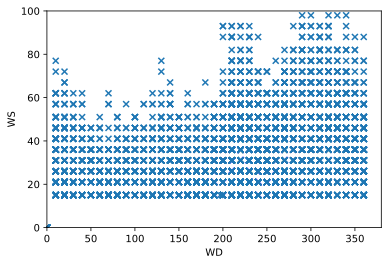

In [14]:
df_summer = df[list(map(lambda x : str(x)[4:6] in ["06", "07", "08"], df.index))].copy()
plt.scatter(df_summer["WD"], df_summer["WS"], marker='x')
plt.xlabel("WD")
plt.ylabel("WS")
plt.xlim([0,380])
plt.ylim([0,100])

In [15]:
plt.scatter(df["WD"], df["WS"], marker="x")
plt.xlabel("WD")
plt.ylabel("WS")
plt.xlim([0,380])
plt.ylim([0,100])

(0, 100)

In [17]:
X = np.array([df["WD"].values, np.ones(len(df))]).T
y = df["WS"].values
theta = np.linalg.solve(X.T @ X, X.T @ y)
plt.scatter(df["WD"], df["WS"], marker="x")
plt.xlabel("WD")
plt.ylabel("WS")
plt.plot([0,100], [theta[1], 100*theta[0]+theta[1]], 'C1')
plt.xlim([0,380])
plt.ylim([0,100])

(0, 100)

In [19]:
x = df["WD"].values
min_x, max_x = x.min(), x.max()
x = 2*(x - min_x)/(max_x - min_x) - 1

def ls_poly(x, y, degree):
    X = np.array([x**i for i in range(degree,-1,-1)]).T
    return np.linalg.solve(X.T @ X, X.T @ y)

theta = ls_poly(x, y, 2)
print(theta)

[ 254.2747935   156.83421841 -355.77481976]


In [20]:
def plot_regression_poly(theta):
    degree = len(theta)-1
    xt0 = np.linspace(0,380, 400)
    xt = 2*(xt0 - min_x)/(max_x - min_x) - 1
    Xt = np.array([xt**i for i in range(degree,-1,-1)]).T
    yt = Xt @ theta
        
    plt.scatter(df["WD"], df["WS"], marker="x")
    ylim = plt.ylim()
    plt.plot(xt0, yt, 'C1')
    plt.xlabel("WD")
    plt.ylabel("WS")
    plt.xlim([0,380])
    plt.ylim([0,100])
    
plot_regression_poly(theta)